In [2]:
from google.colab import drive
drive.mount('/content/drive')

# Adjust this path to wherever you uploaded v1.0-mini.tgz
!ls -lh /content/drive/MyDrive/v1.0-mini.tgz

Mounted at /content/drive
-rw------- 1 root root 3.9G May 15 16:44 /content/drive/MyDrive/v1.0-mini.tgz


In [3]:
!mkdir -p /content/data/nuscenes
!tar -xzf /content/drive/MyDrive/v1.0-mini.tgz -C /content/data/nuscenes
!ls /content/data/nuscenes

LICENSE  maps  samples	sweeps	v1.0-mini


In [6]:
!pip install nuscenes-devkit -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.0/316.0 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 72.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 13.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pointpats 2.5.5 requires shapely>=2.1, but you have shapely 2.0.7 which is incompatible.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
shap 0.51.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
esda 2.9.0 requires shapely>=2.1, but you have shapely 2.0.7 which is incompatible.
opencv-pyth

In [1]:
from google.colab import drive
drive.mount('/content/drive')

# Verify data is still there from before
!ls /content/data/nuscenes

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
LICENSE  maps  samples	sweeps	v1.0-mini


In [2]:
import numpy as np
print(f"NumPy version: {np.__version__}")
# Should print 1.26.4 — that's correct for nuscenes-devkit

from nuscenes.nuscenes import NuScenes
print("nuScenes import: OK")

NumPy version: 1.26.4
nuScenes import: OK


Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.676 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.

Total samples: 404


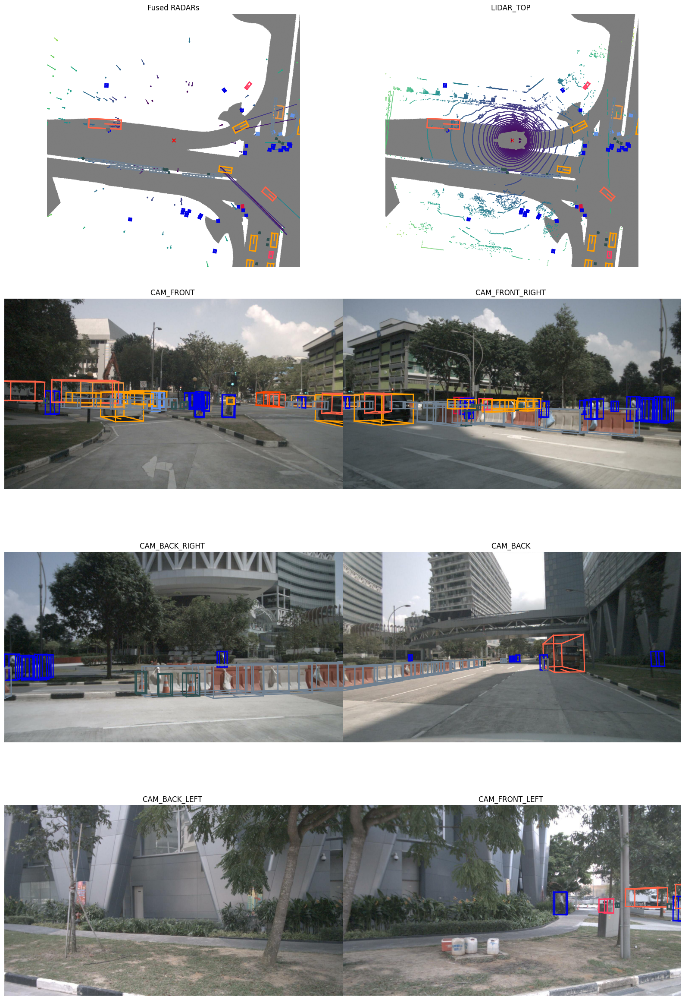

In [3]:
from nuscenes.nuscenes import NuScenes

nusc = NuScenes(version='v1.0-mini', dataroot='/content/data/nuscenes', verbose=True)
print(f"\nTotal samples: {len(nusc.sample)}")

# Render a sample to confirm everything loads
my_sample = nusc.sample[10]
nusc.render_sample(my_sample['token'])

In [4]:
"""
nuScenes data loader for EdgeMiner.

Returns paired (camera image, LiDAR point cloud) samples for contrastive training.
Designed for nuScenes mini but works on full nuScenes with no changes.
"""

from pathlib import Path
from typing import Optional

import numpy as np
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

from nuscenes.nuscenes import NuScenes
from nuscenes.utils.data_classes import LidarPointCloud


class NuScenesPairs(Dataset):
    """
    Camera-LiDAR paired dataset for contrastive learning.

    For each nuScenes sample, returns:
        - front camera image, resized + normalized
        - LiDAR point cloud, downsampled to a fixed number of points
        - sample token (string) for traceability into retrieval / evaluation
    """

    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD = [0.229, 0.224, 0.225]

    def __init__(
        self,
        dataroot: str,
        version: str = "v1.0-mini",
        camera_channel: str = "CAM_FRONT",
        image_size: int = 224,
        num_lidar_points: int = 4096,
        split_tokens: Optional[list] = None,
    ):
        """
        Args:
            dataroot: path to nuScenes data folder (contains v1.0-mini/, samples/, etc.)
            version: dataset version, "v1.0-mini" or "v1.0-trainval"
            camera_channel: which camera to use, default front
            image_size: square crop size for image encoder
            num_lidar_points: number of points to sample from each LiDAR sweep
            split_tokens: optional list of sample tokens to restrict to (for train/val split)
        """
        self.dataroot = Path(dataroot)
        self.nusc = NuScenes(version=version, dataroot=str(dataroot), verbose=False)
        self.camera_channel = camera_channel
        self.num_lidar_points = num_lidar_points

        if split_tokens is not None:
            self.samples = [s for s in self.nusc.sample if s["token"] in split_tokens]
        else:
            self.samples = list(self.nusc.sample)

        self.image_transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.IMAGENET_MEAN, std=self.IMAGENET_STD),
        ])

    def __len__(self) -> int:
        return len(self.samples)

    def _load_image(self, sample: dict) -> torch.Tensor:
        cam_data = self.nusc.get("sample_data", sample["data"][self.camera_channel])
        img_path = self.dataroot / cam_data["filename"]
        img = Image.open(img_path).convert("RGB")
        return self.image_transform(img)

    def _load_lidar(self, sample: dict) -> torch.Tensor:
        lidar_data = self.nusc.get("sample_data", sample["data"]["LIDAR_TOP"])
        lidar_path = self.dataroot / lidar_data["filename"]
        pc = LidarPointCloud.from_file(str(lidar_path))
        # pc.points has shape (4, N): x, y, z, intensity
        points = pc.points.T  # (N, 4)

        # Random sampling to fixed size for batching.
        # Production systems use farthest point sampling — random is fine for a baseline.
        n = points.shape[0]
        if n >= self.num_lidar_points:
            idx = np.random.choice(n, self.num_lidar_points, replace=False)
        else:
            idx = np.random.choice(n, self.num_lidar_points, replace=True)
        points = points[idx]

        return torch.from_numpy(points).float()

    def __getitem__(self, idx: int) -> dict:
        sample = self.samples[idx]
        return {
            "image": self._load_image(sample),
            "lidar": self._load_lidar(sample),
            "token": sample["token"],
        }


In [5]:
ds = NuScenesPairs(
    dataroot='/content/data/nuscenes',
    version='v1.0-mini'
)
print(f"Dataset size: {len(ds)}")

sample = ds[0]
print(f"Image shape: {sample['image'].shape}")
print(f"LiDAR shape: {sample['lidar'].shape}")
print(f"Token: {sample['token']}")

Dataset size: 404
Image shape: torch.Size([3, 224, 224])
LiDAR shape: torch.Size([4096, 4])
Token: ca9a282c9e77460f8360f564131a8af5


In [1]:
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"Device: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")

CUDA available: True
Device: Tesla T4


In [6]:
"""
Dual encoder for EdgeMiner: camera tower + LiDAR tower with shared embedding space.

Camera tower: DINOv2 (frozen backbone, trainable projection head)
LiDAR tower: lightweight PointNet (trainable end-to-end)

Both project to a shared L2-normalized embedding space for contrastive training.
"""

import torch
import torch.nn as nn
import torch.nn.functional as F


class ImageEncoder(nn.Module):
    """DINOv2 ViT-S/14 backbone with a small projection head."""

    def __init__(self, embed_dim: int = 256, freeze_backbone: bool = True):
        super().__init__()
        # DINOv2 small, pretrained, self-supervised — great fit for the JD narrative
        self.backbone = torch.hub.load("facebookresearch/dinov2", "dinov2_vits14")
        backbone_dim = 384  # ViT-S output dim

        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False

        self.projection = nn.Sequential(
            nn.Linear(backbone_dim, 512),
            nn.GELU(),
            nn.Linear(512, embed_dim),
        )

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        # DINOv2 expects 14-pixel multiples — resize input from 224 to 224 (16*14) is fine
        features = self.backbone(images)  # (B, 384)
        emb = self.projection(features)   # (B, embed_dim)
        return F.normalize(emb, dim=-1)


class PointNetEncoder(nn.Module):
    """
    Minimal PointNet for LiDAR. Permutation-invariant via max pooling.

    Input: (B, N, 4) — N points with (x, y, z, intensity)
    Output: (B, embed_dim), L2 normalized
    """

    def __init__(self, embed_dim: int = 256, input_channels: int = 4):
        super().__init__()
        self.point_mlp = nn.Sequential(
            nn.Conv1d(input_channels, 64, 1),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
            nn.Conv1d(64, 128, 1),
            nn.BatchNorm1d(128),
            nn.ReLU(inplace=True),
            nn.Conv1d(128, 256, 1),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Conv1d(256, 512, 1),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
        )
        self.projection = nn.Sequential(
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Linear(256, embed_dim),
        )

    def forward(self, points: torch.Tensor) -> torch.Tensor:
        # points: (B, N, 4) -> (B, 4, N) for Conv1d
        x = points.transpose(1, 2)
        x = self.point_mlp(x)            # (B, 512, N)
        x = torch.max(x, dim=2).values   # (B, 512), permutation-invariant
        emb = self.projection(x)         # (B, embed_dim)
        return F.normalize(emb, dim=-1)


class DualEncoder(nn.Module):
    """
    Wraps the camera and LiDAR towers into a single module.

    forward() returns a dict with both embeddings for use in InfoNCE loss.
    """

    def __init__(self, embed_dim: int = 256, freeze_image_backbone: bool = True):
        super().__init__()
        self.image_encoder = ImageEncoder(embed_dim=embed_dim, freeze_backbone=freeze_image_backbone)
        self.lidar_encoder = PointNetEncoder(embed_dim=embed_dim)
        # Learnable temperature, CLIP-style. Starts at 0.07 (in log space: ln(1/0.07) ≈ 2.66).
        self.logit_scale = nn.Parameter(torch.tensor(2.66))

    def forward(self, images: torch.Tensor, points: torch.Tensor) -> dict:
        return {
            "image_emb": self.image_encoder(images),
            "lidar_emb": self.lidar_encoder(points),
            "logit_scale": self.logit_scale.exp().clamp(max=100.0),
        }


def info_nce_loss(image_emb: torch.Tensor, lidar_emb: torch.Tensor, logit_scale: torch.Tensor) -> torch.Tensor:
    """
    Symmetric InfoNCE loss (CLIP-style).

    Diagonal of the similarity matrix is positive pairs (same sample),
    off-diagonal is negatives (different samples in the batch).
    """
    logits = logit_scale * image_emb @ lidar_emb.t()        # (B, B)
    labels = torch.arange(logits.size(0), device=logits.device)
    loss_i2l = F.cross_entropy(logits, labels)
    loss_l2i = F.cross_entropy(logits.t(), labels)
    return (loss_i2l + loss_l2i) / 2



In [7]:
import torch

# Build the model
model = DualEncoder(embed_dim=256, freeze_image_backbone=True).cuda()
model.eval()

# Use a real sample from our dataset, not random tensors
sample = ds[0]
images = sample['image'].unsqueeze(0).cuda()      # (1, 3, 224, 224)
points = sample['lidar'].unsqueeze(0).cuda()      # (1, 4096, 4)

with torch.no_grad():
    out = model(images, points)

print(f"Image embedding shape: {out['image_emb'].shape}")
print(f"LiDAR embedding shape: {out['lidar_emb'].shape}")
print(f"Image embedding norm:  {out['image_emb'].norm(dim=-1).item():.4f}  (should be 1.0)")
print(f"LiDAR embedding norm:  {out['lidar_emb'].norm(dim=-1).item():.4f}  (should be 1.0)")
print(f"Logit scale: {out['logit_scale'].item():.3f}")

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 144MB/s]


Image embedding shape: torch.Size([1, 256])
LiDAR embedding shape: torch.Size([1, 256])
Image embedding norm:  1.0000  (should be 1.0)
LiDAR embedding norm:  1.0000  (should be 1.0)
Logit scale: 14.296


In [8]:
"""
Contrastive loss for EdgeMiner: symmetric InfoNCE (CLIP-style).

Given a batch of N camera-LiDAR pairs from the same N scenes, the loss treats
the diagonal of the similarity matrix as positive pairs and off-diagonal as
negatives. Symmetric means we compute both image-to-LiDAR and LiDAR-to-image
losses and average them.
"""

import torch
import torch.nn.functional as F


def info_nce_loss(
    image_emb: torch.Tensor,
    lidar_emb: torch.Tensor,
    logit_scale: torch.Tensor,
) -> dict:
    """
    Symmetric InfoNCE loss.

    Args:
        image_emb: (B, D) L2-normalized image embeddings
        lidar_emb: (B, D) L2-normalized LiDAR embeddings
        logit_scale: scalar temperature multiplier (exp of learnable parameter)

    Returns:
        dict with:
            loss: scalar tensor, mean of i2l and l2i cross-entropy
            acc_i2l: image-to-LiDAR top-1 accuracy (diagonal hit rate)
            acc_l2i: LiDAR-to-image top-1 accuracy
    """
    # Similarity matrix (B, B). Diagonal entries are positive pairs.
    logits = logit_scale * image_emb @ lidar_emb.t()

    # Targets: each row should match itself (same index in the batch)
    labels = torch.arange(logits.size(0), device=logits.device)

    loss_i2l = F.cross_entropy(logits, labels)
    loss_l2i = F.cross_entropy(logits.t(), labels)
    loss = (loss_i2l + loss_l2i) / 2

    # Top-1 accuracy for diagnostics
    with torch.no_grad():
        acc_i2l = (logits.argmax(dim=1) == labels).float().mean()
        acc_l2i = (logits.argmax(dim=0) == labels).float().mean()

    return {
        "loss": loss,
        "acc_i2l": acc_i2l.item(),
        "acc_l2i": acc_l2i.item(),
    }


def recall_at_k(
    image_emb: torch.Tensor,
    lidar_emb: torch.Tensor,
    k_values: tuple = (1, 5, 10),
) -> dict:
    """
    Compute Recall@K for image-to-LiDAR retrieval on a held-out set.

    For each image, rank all LiDAR embeddings by similarity. A retrieval counts
    as correct if the matching LiDAR (same index) is in the top-K.

    Args:
        image_emb: (N, D) embeddings for all val images
        lidar_emb: (N, D) embeddings for all val LiDAR scans
        k_values: which K values to report

    Returns:
        dict mapping "recall@K" -> float
    """
    sim = image_emb @ lidar_emb.t()  # (N, N)
    n = sim.size(0)
    labels = torch.arange(n, device=sim.device)

    # For each query (row), get the rank of the correct answer
    # argsort descending: higher similarity = lower rank index
    ranks = sim.argsort(dim=1, descending=True)

    results = {}
    for k in k_values:
        topk = ranks[:, :k]                                    # (N, k)
        hits = (topk == labels.unsqueeze(1)).any(dim=1).float()
        results[f"recall@{k}"] = hits.mean().item()
    return results


In [9]:
"""
Training loop for EdgeMiner dual encoder.

Designed to run end-to-end in Colab on a T4 GPU. Logs to TensorBoard and
saves the best checkpoint (by val Recall@5) to Google Drive.

Usage in Colab:
    from src.training.train import train_edgeminer
    train_edgeminer(
        dataroot='/content/data/nuscenes',
        checkpoint_dir='/content/drive/MyDrive/edgeminer/checkpoints',
        log_dir='/content/edgeminer_logs',
        num_epochs=20,
        batch_size=32,
        lr=3e-4,
    )

Or from CLI:
    python -m src.training.train --config configs/default.yaml
"""

import os
import random
from pathlib import Path
from typing import Optional

import numpy as np
import torch
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

# These imports assume the file is run as part of the src package.
# In Colab where you paste the contents, the imports below will already be
# defined in the notebook namespace, so the try/except handles both cases.
try:
    from src.data.nuscenes_loader import NuScenesPairs
    from src.models.dual_encoder import DualEncoder
    from src.training.contrastive_loss import info_nce_loss, recall_at_k
except ImportError:
    pass  # Assume classes are already in the Colab namespace


def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


def split_dataset(dataset, val_ratio: float = 0.2, seed: int = 42):
    """80/20 train/val split by sample token (deterministic)."""
    rng = random.Random(seed)
    all_tokens = [s["token"] for s in dataset.nusc.sample]
    rng.shuffle(all_tokens)
    n_val = int(len(all_tokens) * val_ratio)
    val_tokens = set(all_tokens[:n_val])
    train_tokens = set(all_tokens[n_val:])

    train_ds = NuScenesPairs(
        dataroot=dataset.dataroot,
        version="v1.0-mini",
        split_tokens=list(train_tokens),
    )
    val_ds = NuScenesPairs(
        dataroot=dataset.dataroot,
        version="v1.0-mini",
        split_tokens=list(val_tokens),
    )
    return train_ds, val_ds


@torch.no_grad()
def evaluate(model, val_loader, device) -> dict:
    """Compute val loss and Recall@K over the full val set."""
    model.eval()
    all_image_emb, all_lidar_emb = [], []
    losses = []

    for batch in val_loader:
        images = batch["image"].to(device, non_blocking=True)
        points = batch["lidar"].to(device, non_blocking=True)
        out = model(images, points)
        loss_dict = info_nce_loss(
            out["image_emb"], out["lidar_emb"], out["logit_scale"]
        )
        losses.append(loss_dict["loss"].item())
        all_image_emb.append(out["image_emb"])
        all_lidar_emb.append(out["lidar_emb"])

    image_emb = torch.cat(all_image_emb, dim=0)
    lidar_emb = torch.cat(all_lidar_emb, dim=0)
    recall = recall_at_k(image_emb, lidar_emb, k_values=(1, 5, 10))

    return {
        "val_loss": np.mean(losses),
        **recall,
        "num_val": image_emb.size(0),
    }


def train_edgeminer(
    dataroot: str,
    checkpoint_dir: str = "/content/drive/MyDrive/edgeminer/checkpoints",
    log_dir: str = "/content/edgeminer_logs",
    num_epochs: int = 20,
    batch_size: int = 32,
    lr: float = 3e-4,
    weight_decay: float = 1e-4,
    num_workers: int = 2,
    embed_dim: int = 256,
    freeze_image_backbone: bool = True,
    seed: int = 42,
    log_every: int = 5,
) -> dict:
    """
    Train the dual encoder end-to-end.

    Returns the final metrics dict from the best checkpoint.
    """
    set_seed(seed)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Training on: {device}")

    # ---- Data ----
    print("Loading nuScenes mini...")
    full_ds = NuScenesPairs(dataroot=dataroot, version="v1.0-mini")
    train_ds, val_ds = split_dataset(full_ds, val_ratio=0.2, seed=seed)
    print(f"Train samples: {len(train_ds)} | Val samples: {len(val_ds)}")

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True,
    )
    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
    )

    # ---- Model ----
    model = DualEncoder(
        embed_dim=embed_dim,
        freeze_image_backbone=freeze_image_backbone,
    ).to(device)

    # Only optimize parameters that require gradients (skip frozen DINOv2)
    trainable_params = [p for p in model.parameters() if p.requires_grad]
    n_params = sum(p.numel() for p in trainable_params)
    print(f"Trainable parameters: {n_params:,}")

    optimizer = torch.optim.AdamW(trainable_params, lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    # ---- Logging & checkpointing setup ----
    Path(checkpoint_dir).mkdir(parents=True, exist_ok=True)
    Path(log_dir).mkdir(parents=True, exist_ok=True)
    writer = SummaryWriter(log_dir=log_dir)
    print(f"TensorBoard logs: {log_dir}")
    print(f"Checkpoints will save to: {checkpoint_dir}")

    # ---- Baseline (random init) eval ----
    baseline = evaluate(model, val_loader, device)
    print(f"\nBaseline (random projection): {baseline}")
    writer.add_scalar("val/recall@5", baseline["recall@5"], 0)
    writer.add_scalar("val/recall@1", baseline["recall@1"], 0)

    # ---- Training loop ----
    best_recall5 = baseline["recall@5"]
    best_metrics = baseline
    step = 0

    for epoch in range(1, num_epochs + 1):
        model.train()
        epoch_losses, epoch_accs = [], []

        for batch_idx, batch in enumerate(train_loader):
            images = batch["image"].to(device, non_blocking=True)
            points = batch["lidar"].to(device, non_blocking=True)

            optimizer.zero_grad()
            out = model(images, points)
            loss_dict = info_nce_loss(
                out["image_emb"], out["lidar_emb"], out["logit_scale"]
            )
            loss = loss_dict["loss"]
            loss.backward()
            torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=1.0)
            optimizer.step()

            epoch_losses.append(loss.item())
            epoch_accs.append((loss_dict["acc_i2l"] + loss_dict["acc_l2i"]) / 2)

            writer.add_scalar("train/loss", loss.item(), step)
            writer.add_scalar("train/logit_scale", out["logit_scale"].item(), step)
            step += 1

        scheduler.step()
        train_loss = np.mean(epoch_losses)
        train_acc = np.mean(epoch_accs)

        # ---- Validation ----
        val_metrics = evaluate(model, val_loader, device)
        writer.add_scalar("val/loss", val_metrics["val_loss"], epoch)
        writer.add_scalar("val/recall@1", val_metrics["recall@1"], epoch)
        writer.add_scalar("val/recall@5", val_metrics["recall@5"], epoch)
        writer.add_scalar("val/recall@10", val_metrics["recall@10"], epoch)
        writer.add_scalar("train/loss_epoch", train_loss, epoch)
        writer.add_scalar("train/acc_epoch", train_acc, epoch)

        print(
            f"Epoch {epoch:2d}/{num_epochs} | "
            f"train_loss={train_loss:.4f} acc={train_acc:.3f} | "
            f"val_loss={val_metrics['val_loss']:.4f} "
            f"R@1={val_metrics['recall@1']:.3f} "
            f"R@5={val_metrics['recall@5']:.3f} "
            f"R@10={val_metrics['recall@10']:.3f}"
        )

        # ---- Checkpoint best model by val Recall@5 ----
        if val_metrics["recall@5"] > best_recall5:
            best_recall5 = val_metrics["recall@5"]
            best_metrics = {**val_metrics, "epoch": epoch}
            ckpt_path = Path(checkpoint_dir) / "best.pt"
            torch.save(
                {
                    "epoch": epoch,
                    "model_state_dict": model.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "metrics": val_metrics,
                },
                ckpt_path,
            )
            print(f"  ✓ New best Recall@5={best_recall5:.3f} — saved to {ckpt_path}")

    writer.close()
    print(f"\nTraining complete. Best metrics: {best_metrics}")
    return best_metrics

In [10]:
%load_ext tensorboard
%tensorboard --logdir /content/edgeminer_logs

<IPython.core.display.Javascript object>

In [11]:
best_metrics = train_edgeminer(
    dataroot='/content/data/nuscenes',
    checkpoint_dir='/content/drive/MyDrive/edgeminer/checkpoints',
    log_dir='/content/edgeminer_logs',
    num_epochs=20,
    batch_size=32,
    lr=3e-4,
)
print("\nFinal best metrics:", best_metrics)

Training on: cuda
Loading nuScenes mini...
Train samples: 324 | Val samples: 80


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Trainable parameters: 700,737
TensorBoard logs: /content/edgeminer_logs
Checkpoints will save to: /content/drive/MyDrive/edgeminer/checkpoints

Baseline (random projection): {'val_loss': 3.302935838699341, 'recall@1': 0.012500000186264515, 'recall@5': 0.03750000149011612, 'recall@10': 0.08749999850988388, 'num_val': 80}
Epoch  1/20 | train_loss=3.3219 acc=0.089 | val_loss=3.2225 R@1=0.062 R@5=0.263 R@10=0.450
  ✓ New best Recall@5=0.263 — saved to /content/drive/MyDrive/edgeminer/checkpoints/best.pt
Epoch  2/20 | train_loss=2.4505 acc=0.208 | val_loss=2.6228 R@1=0.075 R@5=0.338 R@10=0.600
  ✓ New best Recall@5=0.338 — saved to /content/drive/MyDrive/edgeminer/checkpoints/best.pt
Epoch  3/20 | train_loss=1.8863 acc=0.330 | val_loss=2.1385 R@1=0.163 R@5=0.675 R@10=0.800
  ✓ New best Recall@5=0.675 — saved to /content/drive/MyDrive/edgeminer/checkpoints/best.pt
Epoch  4/20 | train_loss=1.5638 acc=0.383 | val_loss=1.9354 R@1=0.275 R@5=0.725 R@10=0.887
  ✓ New best Recall@5=0.725 — saved to